In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import itertools

In [2]:
# gut microbes (our data matrix)
gut_microbes = pd.read_csv("../data/raw/gut_16s_abundance.txt", sep = "\t")
gut_microbes

,SampleID,phylum_Actinobacteria,phylum_Bacteroidetes,phylum_Firmicutes,phylum_Proteobacteria,phylum_Verrucomicrobia,phylum_unclassified_Bacteria,class_Actinobacteria,class_Bacilli,class_Bacteroidia,...,genus_Veillonella,genus_unclassified_Bacteria,genus_unclassified_Clostridiales,genus_unclassified_Clostridiales_Incertae.Sedis.XIII,genus_unclassified_Coriobacteriaceae,genus_unclassified_Erysipelotrichaceae,genus_unclassified_Firmicutes,genus_unclassified_Lachnospiraceae,genus_unclassified_Porphyromonadaceae,genus_unclassified_Ruminococcaceae
0,ZOZOW1T-1010,0.000449,0.650866,0.225080,0.007364,0.015835,0.097431,0.000449,0.000138,0.650866,...,0.000000,0.097431,0.007883,0.000035,0.000415,0.002386,0.015697,0.027452,0.000000,0.074128
1,ZOZOW1T-1011,0.000176,0.730518,0.184808,0.003900,0.008186,0.070902,0.000176,0.000070,0.730518,...,0.000035,0.070902,0.008713,0.000141,0.000176,0.000808,0.008608,0.011805,0.000000,0.069215
2,ZOZOW1T-1012,0.000597,0.178364,0.796861,0.000358,0.002788,0.020911,0.000597,0.000119,0.178364,...,0.000080,0.020911,0.022903,0.000518,0.000398,0.001713,0.000876,0.018362,0.000000,0.615351
3,ZOZOW1T-1015,0.000058,0.740726,0.226516,0.005977,0.001207,0.024971,0.000058,0.000029,0.740726,...,0.000029,0.024971,0.013046,0.000086,0.000029,0.004109,0.007730,0.043849,0.000029,0.067096
4,ZOZOW1T-1021,0.001113,0.554580,0.364195,0.038358,0.000059,0.041286,0.001113,0.000059,0.554580,...,0.000410,0.041286,0.006208,0.000117,0.000176,0.000468,0.000996,0.132584,0.015753,0.044624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
850,ZJTKAE3-2012,0.000333,0.618688,0.376535,0.004055,0.000333,0.000000,0.000333,0.001500,0.618688,...,0.000278,0.000000,0.001111,0.000111,0.000278,0.003333,0.000000,0.010666,0.579190,0.006222
851,ZJTKAE3-2013,0.000464,0.800232,0.171435,0.008732,0.000139,0.000418,0.000464,0.000139,0.800232,...,0.000046,0.000418,0.000697,0.000046,0.000464,0.001579,0.000000,0.009661,0.635764,0.021273
852,ZJTKAE3-2015,0.009662,0.532156,0.445728,0.010115,0.000151,0.000377,0.009662,0.000453,0.532156,...,0.000000,0.000377,0.001057,0.002415,0.007397,0.022418,0.000000,0.030571,0.018267,0.035854
853,ZJTKAE3-6011,0.002607,0.776424,0.204213,0.002080,0.013300,0.001318,0.002607,0.000293,0.774578,...,0.000000,0.001318,0.038903,0.003281,0.000205,0.018016,0.000029,0.009784,0.001728,0.021649


In [3]:
# subject data (filter for IRIS --> not "Unknown")
subject_data = pd.read_csv("../data/raw/S1_Subjects.csv")
subject_data

,SubjectID,consented,IRIS,SSPG,FPG,SSPG.Date,Class,Gender,Ethnicity,Adj.age,BMI,Num_All_Visits,Days_Span,Num_Healthy_Visits
0,ZOZOW1T,YES,IS,91.5,131.75,8/7/14,Diabetic,M,C,59.48,21.47,152,2475,56
1,ZOQSGYW,NO,Unknown,NaN,NaN,NaN,Crossover,M,A,58.40,21.86,5,515,4
2,ZOQM06Q,NO,Unknown,NaN,NaN,NaN,Prediabetic,F,A,25.91,19.37,3,23,2
3,ZODIOFW,NO,Unknown,NaN,NaN,NaN,Crossover,F,A,57.86,26.69,1,0,1
4,ZIS22OE,YES,Unknown,NaN,NaN,NaN,Prediabetic,F,C,NaN,NaN,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101,ZK4CK8Y,YES,IS,40.0,87.00,4/23/13,Prediabetic,F,C,50.02,26.94,10,874,8
102,ZK112BX,NO,IR,234.0,115.00,5/7/13,Crossover,F,A,57.72,28.89,20,1271,11
103,ZK01UI6,NO,Unknown,NaN,NaN,NaN,Control,M,A,57.78,NaN,1,0,1
104,ZJXC41N,YES,IS,75.0,94.00,10/15/13,Prediabetic,F,B,49.69,28.24,23,982,7


In [32]:
# sample data (filter for CL4 --> "Healthy")
sample_data = pd.read_csv("../data/raw/S3_SampleList.csv")
sample_data

,SubjectID,SampleID,Days_Since_Start,CL1,CL2,CL3,CL4,Cytokines,ClinicLabs,Metabolites,Proteins,Transcripts,Gut_16S,Nasal_16S,Num_Type
0,ZOZOW1T,ZOZOW1T-01,-1068.0,D0,UNK_I,Infection_Early,Infection,0,0,1,0,0,0,0,1
1,ZOZOW1T,ZOZOW1T-02,-1064.0,D4,UNK_II,Infection_Middle,Infection,0,0,1,0,1,0,0,2
2,ZOZOW1T,ZOZOW1T-03,-1047.0,D21,UNK_III,Infection_Recovery_Early,Infection_L,0,0,1,0,0,0,0,1
3,ZOZOW1T,ZOZOW1T-04,-960.0,NaN,UNK_IV,NaN,Healthy,0,0,0,0,1,0,0,1
4,ZOZOW1T,ZOZOW1T-05,-952.0,NaN,UNK_V,NaN,Healthy,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1087,ZJTKAE3,ZJTKAE3-6011,766.0,NaN,NaN,NaN,Healthy,1,1,1,0,0,1,1,5
1088,ZJTKAE3,ZJTKAE3-07,773.0,NaN,NaN,NaN,Fiber,1,1,1,1,1,0,0,5
1089,ZJTKAE3,ZJTKAE3-6021,829.0,NaN,NaN,NaN,Healthy,1,1,1,1,1,1,1,7
1090,ZJTKAE3,ZJTKAE3-6031,948.0,NaN,NaN,NaN,Healthy,1,1,1,1,1,0,1,6


# Subject Data EDA

### `SubjectID`

### `consented`
- discrete:
    - YES (83)
    - NO (23)

### `IRIS` (Insulin-Resistant or Insulin-Sensitive)
- categorical:
    - IR (insulin-resistant, classified by SSPG $\geq$ 150 mg/dl, 35)
    - IS (insulin-sensitive, classified by SPG $<$ 150 mg/dl 31)
    - Unknown (40)

### `SSPG` (Steady-State Plasma Glucose)
- continuous
    - min: 40 mg/dl
    - median: 156.935 mg/dl
    - max: 276 mg/dl

### `FPG` (Fasting Plasma Glucose)
- continuous
    - min: 78 mg/dl
    - median: 97.75 mg/dl
    - max: 138 mg/dl

### `SSPG.Date` (Date which participants underwent the insulin suppression test measured through SSPG)
- date
    - min: 5/30/12
    - max: 4/10/18

### `Class` (Classification of individuals based on their longitudinal A1C, fasting glucose and OGTT)
- categorical:
    - Control (19)
    - Crossover (16)
    - Diabetic (2)
    - Prediabetic (69)

### `Gender`
- categorical:
    - F (Female, 55)
    - M (Male, 51)
 
### `Ethnicity`
- categorical:
    - A (Asian, 24)
    - B (Black, 6)
    - C (Caucasian, 69)
    - H (Hispanic, 4)
    - Unknown (2)
 
### `Adj.age`
- continuous
    - min: 25.91
    - median: 55.86
    - max: 75.23

### `BMI`
- continuous
    - min: 19.1
    - median: 27.91
    - max: 40.83

### `Num_All_Visits`
- discrete
    - min: 1 visit
    - median: 7 visits
    - max: 152 visits

### `Days_Span`
- discrete
    - min: 0 days
    - median: 577 days
    - max: 2,475 days

### `Num_Healthy_Visits`
- discrete
    - min: 0 visits
    - median: 5 visits
    - max: 56 visits

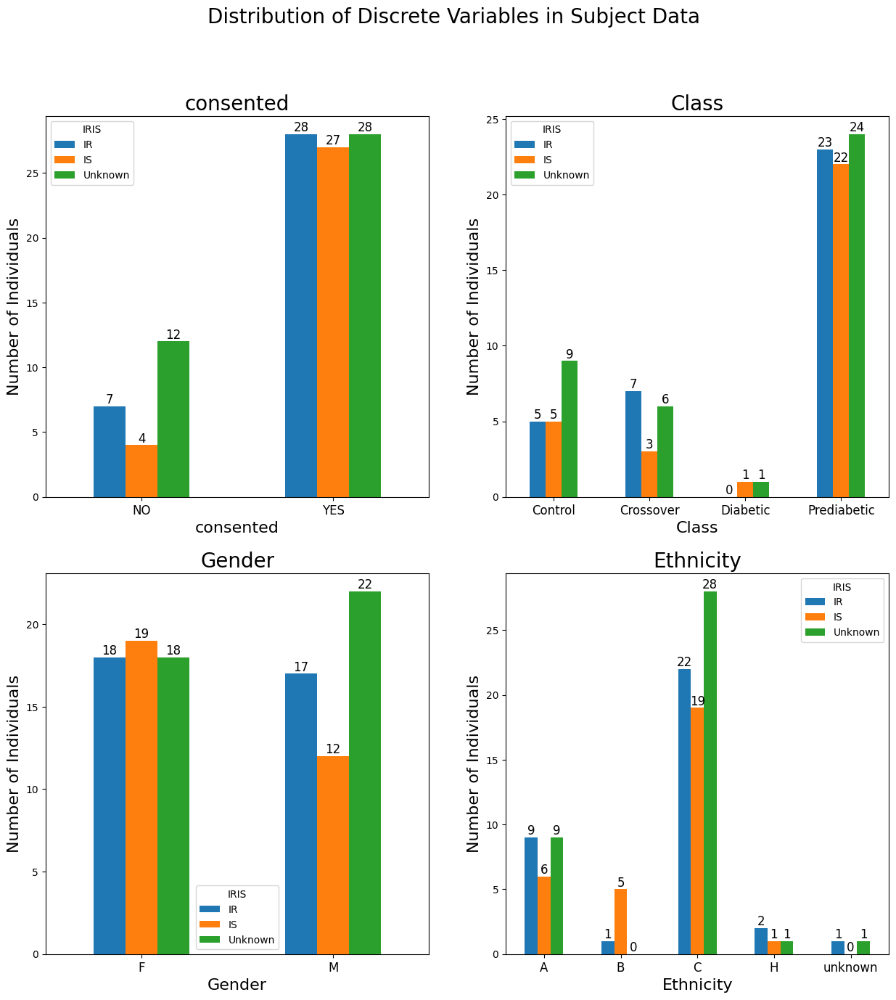

In [33]:
# discrete variables bar charts grouped by IRIS classification

fig, axs = plt.subplots(2, 2, figsize=(15, 15))
fig.suptitle('Distribution of Discrete Variables in Subject Data', fontsize=20)
discrete_var = ['consented', 'Class', 'Gender', 'Ethnicity']
groups = ['IR', 'IS', 'Unknown']

axs = axs.ravel()

for i in range(len(discrete_var)):
    col = discrete_var[i]
    
    dfp = subject_data.pivot_table(index=col, columns='IRIS', aggfunc='size')
    dfp.plot(kind='bar', rot=0, ax=axs[i])
    axs[i].set_title(col, fontsize=20)
    axs[i].set_xlabel(col, fontsize=16)
    axs[i].set_ylabel('Number of Individuals', fontsize=16)
    axs[i].tick_params(axis="x", labelsize=12)
    # axs[i].bar_label(axs[i].containers)
    for container in axs[i].containers:
        axs[i].bar_label(container, fontsize=12)
    
plt.show()

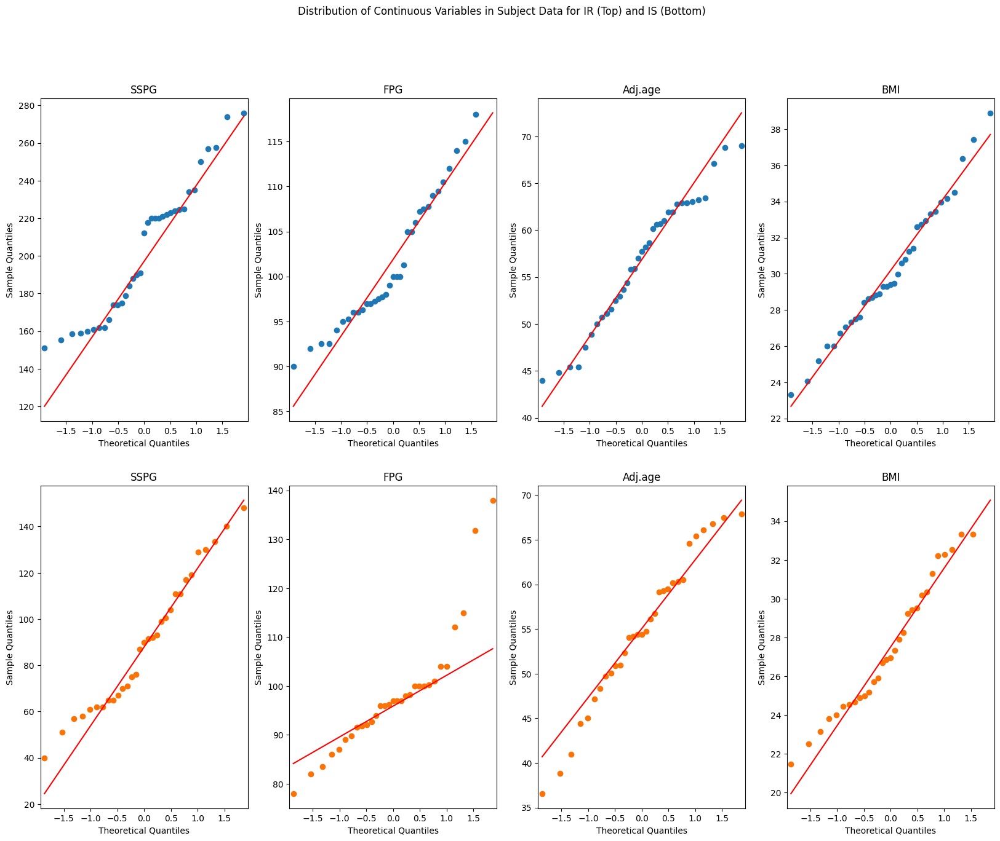

In [34]:
# continuous variables qq plots
# check Gaussian

fig, axs = plt.subplots(2, 4, figsize=(20, 15))
fig.suptitle('Distribution of Continuous Variables in Subject Data for IR (Top) and IS (Bottom)')
continuous_var = ['SSPG', 'FPG', 'Adj.age', 'BMI'] 

subject_data_IR = subject_data[subject_data['IRIS'] == 'IR']
subject_data_IS = subject_data[subject_data['IRIS'] == 'IS']

axs = axs.ravel()

for i in range(4):
    col = continuous_var[i]
    sm.qqplot(subject_data_IR[col], line='q', ax=axs[i])
    axs[i].set_title(col)

for i in range(4, 8):
    col = continuous_var[i-4]
    sm.qqplot(subject_data_IS[col], line='q', ax=axs[i], markerfacecolor='#F97306', markeredgecolor='#F97306')
    axs[i].set_title(col)
    
plt.show()

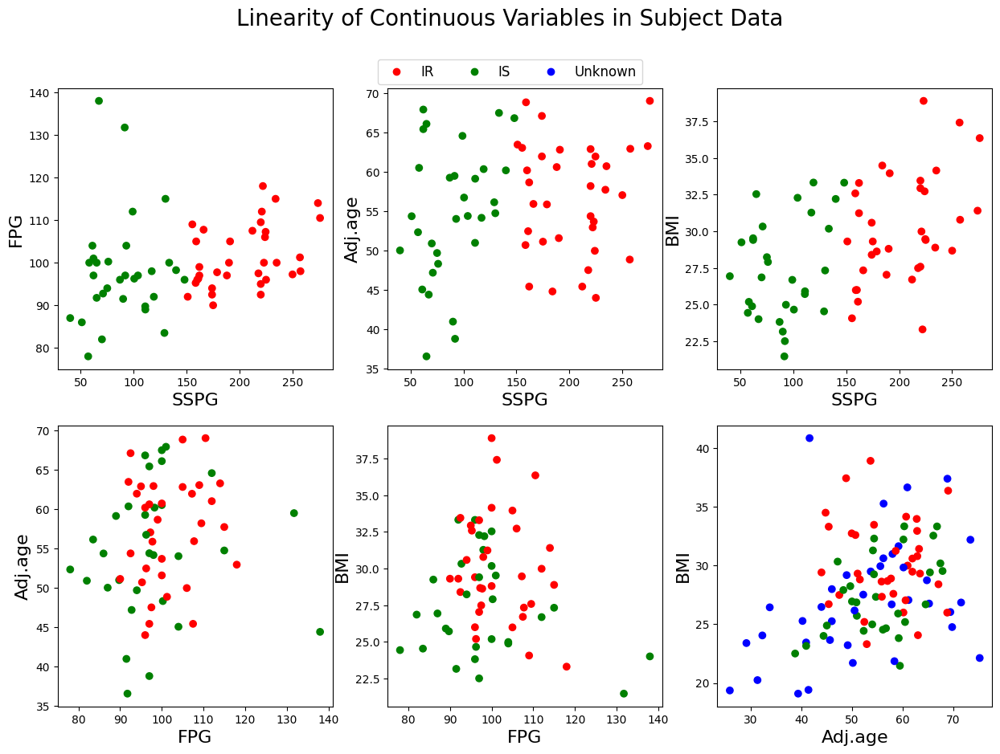

In [35]:
# continuous variables scatter plots

fig, axs = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Linearity of Continuous Variables in Subject Data', fontsize=20)
pairs = list(itertools.combinations(continuous_var, 2))
colors = {'IR': 'red', 'IS': 'green', 'Unknown': 'blue'}

axs = axs.ravel()

for i in range(len(pairs)):
    x = subject_data[pairs[i][0]]
    y = subject_data[pairs[i][1]]
    c = [colors.get(i) for i in subject_data['IRIS']]
    axs[i].scatter(x, y, c=c, label=c)
    axs[i].set_xlabel(pairs[i][0], fontsize=16)
    axs[i].set_ylabel(pairs[i][1], fontsize=16)

markers = [plt.Line2D([0,0], [0,0], color=color, marker='o', linestyle='') for color in colors.values()]
fig.legend(markers, colors.keys(), numpoints=1, loc="center", bbox_to_anchor=(0.5, 0.9), ncol=3, bbox_transform=fig.transFigure, fontsize=12)
plt.show()

# Gut Microbes

"Only microbial taxa that were present (>0) or microbial genes with >0.1% abundance in more than a half of the entire collection (>400) were used further for downstream analysis. Microbial taxa and genes were arcsine transformed for downstream linear analyses" (Zhou W, et al, Methods—Multivariate data analysis).

In [36]:
genus_col = []
for col in gut_microbes.columns:
    if 'genus' in col:
        genus_col.append(col)

gut_microbes_genera = gut_microbes[['SampleID'] + genus_col]
gut_microbes_genera = gut_microbes_genera.set_index('SampleID')
gut_microbes_genera

,genus_Akkermansia,genus_Alistipes,genus_Anaerotruncus,genus_Anaerovorax,genus_Bacteroides,genus_Barnesiella,genus_Bilophila,genus_Blautia,genus_Butyricicoccus,genus_Butyricimonas,...,genus_Veillonella,genus_unclassified_Bacteria,genus_unclassified_Clostridiales,genus_unclassified_Clostridiales_Incertae.Sedis.XIII,genus_unclassified_Coriobacteriaceae,genus_unclassified_Erysipelotrichaceae,genus_unclassified_Firmicutes,genus_unclassified_Lachnospiraceae,genus_unclassified_Porphyromonadaceae,genus_unclassified_Ruminococcaceae
SampleID,,,,,,,,,,,,,,,,,,,,,
ZOZOW1T-1010,0.015835,0.020572,0.000035,0.000484,0.589289,0.000588,0.000000,0.009854,0.000173,0.000899,...,0.000000,0.097431,0.007883,0.000035,0.000415,0.002386,0.015697,0.027452,0.000000,0.074128
ZOZOW1T-1011,0.008186,0.026035,0.000070,0.000211,0.625009,0.001405,0.000000,0.004146,0.000070,0.001722,...,0.000035,0.070902,0.008713,0.000141,0.000176,0.000808,0.008608,0.011805,0.000000,0.069215
ZOZOW1T-1012,0.002788,0.004063,0.000199,0.000358,0.163706,0.000279,0.000000,0.019836,0.000040,0.000040,...,0.000080,0.020911,0.022903,0.000518,0.000398,0.001713,0.000876,0.018362,0.000000,0.615351
ZOZOW1T-1015,0.001207,0.009368,0.000000,0.000316,0.691043,0.000718,0.000000,0.013275,0.000172,0.000172,...,0.000029,0.024971,0.013046,0.000086,0.000029,0.004109,0.007730,0.043849,0.000029,0.067096
ZOZOW1T-1021,0.000059,0.010248,0.000117,0.000293,0.488053,0.002987,0.000000,0.008784,0.000527,0.001405,...,0.000410,0.041286,0.006208,0.000117,0.000176,0.000468,0.000996,0.132584,0.015753,0.044624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZJTKAE3-2012,0.000333,0.001944,0.000000,0.000111,0.036720,0.000000,0.000056,0.012999,0.000722,0.000000,...,0.000278,0.000000,0.001111,0.000111,0.000278,0.003333,0.000000,0.010666,0.579190,0.006222
ZJTKAE3-2013,0.000139,0.003948,0.000046,0.000000,0.156015,0.000000,0.000000,0.002926,0.000093,0.000000,...,0.000046,0.000418,0.000697,0.000046,0.000464,0.001579,0.000000,0.009661,0.635764,0.021273
ZJTKAE3-2015,0.000151,0.007775,0.000302,0.000302,0.499849,0.000000,0.000302,0.031627,0.001208,0.000000,...,0.000000,0.000377,0.001057,0.002415,0.007397,0.022418,0.000000,0.030571,0.018267,0.035854


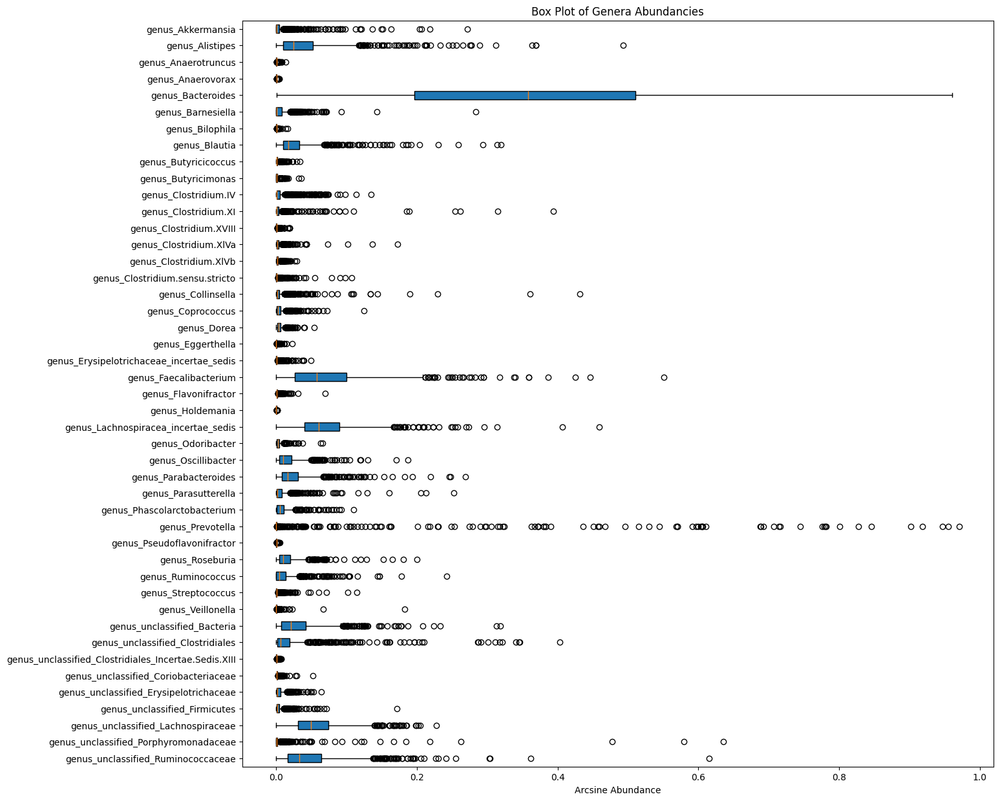

In [37]:
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111)

ax.boxplot(gut_microbes_genera, patch_artist=True, vert=0)
ax.set_xlabel("Arcsine Abundance")
ax.set_yticklabels(gut_microbes_genera.columns)
ax.invert_yaxis()
plt.title("Box Plot of Genera Abundancies")
plt.show()

# Sample Data

We are only interested in samples where gut microbe data is available (`Gut_16S` = 1) and the sample was from a healthy visit (`CL4` = "Healthy").

In [39]:
# filter for Gut_16S, explore CL4

sample_data_gut_healthy = sample_data[(sample_data['Gut_16S'] == 1) & (sample_data['CL4'] == 'Healthy')]
sample_data_gut_healthy

,SubjectID,SampleID,Days_Since_Start,CL1,CL2,CL3,CL4,Cytokines,ClinicLabs,Metabolites,Proteins,Transcripts,Gut_16S,Nasal_16S,Num_Type
43,ZOZOW1T,ZOZOW1T-44,-217.0,NaN,UNK_44,NaN,Healthy,0,0,0,0,0,1,1,2
58,ZOZOW1T,ZOZOW1T-59,41.0,NaN,UNK_59,NaN,Healthy,0,1,1,0,1,1,1,5
60,ZOZOW1T,ZOZOW1T-61,96.0,NaN,NaN,NaN,Healthy,1,1,1,1,1,1,0,6
61,ZOZOW1T,ZOZOW1T-62,132.0,NaN,NaN,NaN,Healthy,0,1,1,1,0,1,0,4
62,ZOZOW1T,ZOZOW1T-63,159.0,NaN,NaN,NaN,Healthy,1,1,1,1,1,1,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1077,ZJTKAE3,ZJTKAE3-01,234.0,NaN,NaN,NaN,Healthy,0,0,0,0,1,1,1,3
1080,ZJTKAE3,ZJTKAE3-04,488.0,NaN,NaN,NaN,Healthy,1,1,1,1,1,1,1,7
1086,ZJTKAE3,ZJTKAE3-06,721.0,NaN,NaN,NaN,Healthy,1,1,1,1,1,1,1,7
1087,ZJTKAE3,ZJTKAE3-6011,766.0,NaN,NaN,NaN,Healthy,1,1,1,0,0,1,1,5


# Merged DataFrame

In [40]:
subject_data_IRIS = subject_data[subject_data['IRIS'] != 'Unknown'].drop(
    columns=['consented', 'SSPG.Date', 'Num_All_Visits', 'Days_Span', 'Num_Healthy_Visits']
)
sample_data_gut_healthy_short = sample_data_gut_healthy[['SubjectID', 'SampleID']]
merged_df = pd.merge(gut_microbes_genera, sample_data_gut_healthy_short, on='SampleID', how='inner')
merged_df = pd.merge(merged_df, subject_data_IRIS, on='SubjectID', how='inner')
merged_df

,SampleID,genus_Akkermansia,genus_Alistipes,genus_Anaerotruncus,genus_Anaerovorax,genus_Bacteroides,genus_Barnesiella,genus_Bilophila,genus_Blautia,genus_Butyricicoccus,...,genus_unclassified_Ruminococcaceae,SubjectID,IRIS,SSPG,FPG,Class,Gender,Ethnicity,Adj.age,BMI
0,ZOZOW1T-4026,0.004521,0.010944,0.000296,0.000211,0.161709,0.003465,0.000042,0.012296,0.000634,...,0.057297,ZOZOW1T,IS,91.5,131.75,Diabetic,M,C,59.48,21.47
1,ZOZOW1T-44,0.000092,0.077644,0.000917,0.000413,0.320556,0.016140,0.000825,0.028765,0.003577,...,0.048894,ZOZOW1T,IS,91.5,131.75,Diabetic,M,C,59.48,21.47
2,ZOZOW1T-59,0.000000,0.046771,0.000149,0.000186,0.265494,0.007770,0.000037,0.022419,0.000781,...,0.102428,ZOZOW1T,IS,91.5,131.75,Diabetic,M,C,59.48,21.47
3,ZOZOW1T-6021,0.002365,0.007882,0.000000,0.000300,0.581182,0.001276,0.000037,0.012573,0.000488,...,0.028149,ZOZOW1T,IS,91.5,131.75,Diabetic,M,C,59.48,21.47
4,ZOZOW1T-6031,0.002988,0.010518,0.000359,0.000299,0.400227,0.002988,0.000060,0.007769,0.001195,...,0.027789,ZOZOW1T,IS,91.5,131.75,Diabetic,M,C,59.48,21.47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
326,ZJTKAE3-01,0.000128,0.013492,0.000281,0.000179,0.535579,0.000000,0.013518,0.019690,0.001709,...,0.013798,ZJTKAE3,IR,162.0,99.00,Control,F,C,58.65,31.24
327,ZJTKAE3-04,0.044381,0.008818,0.000390,0.003118,0.258440,0.000049,0.001072,0.161007,0.003118,...,0.077118,ZJTKAE3,IR,162.0,99.00,Control,F,C,58.65,31.24
328,ZJTKAE3-06,0.000951,0.028284,0.000216,0.000389,0.499816,0.000043,0.000195,0.036826,0.000800,...,0.025387,ZJTKAE3,IR,162.0,99.00,Control,F,C,58.65,31.24
329,ZJTKAE3-6011,0.013300,0.023699,0.000498,0.001611,0.742764,0.000000,0.000029,0.010898,0.000439,...,0.021649,ZJTKAE3,IR,162.0,99.00,Control,F,C,58.65,31.24


In [41]:
X = merged_df.drop(columns=['SampleID', 'SubjectID'])
X['IRIS'] = X['IRIS'].map({'IR': 0, 'IS': 1, 'Unknown': 2})
X['Class'] = X['Class'].map({'Control': 0, 'Crossover': 1, 'Diabetic': 2, 'Prediabetic': 3})
X['Gender'] = X['Gender'].map({'F': 0, 'M': 1})
X['Ethnicity'] = X['Ethnicity'].map({'A': 0, 'B': 1, 'C': 2, 'H': 3, 'unknown': 4})
X

,genus_Akkermansia,genus_Alistipes,genus_Anaerotruncus,genus_Anaerovorax,genus_Bacteroides,genus_Barnesiella,genus_Bilophila,genus_Blautia,genus_Butyricicoccus,genus_Butyricimonas,...,genus_unclassified_Porphyromonadaceae,genus_unclassified_Ruminococcaceae,IRIS,SSPG,FPG,Class,Gender,Ethnicity,Adj.age,BMI
0,0.004521,0.010944,0.000296,0.000211,0.161709,0.003465,0.000042,0.012296,0.000634,0.003085,...,0.000000,0.057297,1,91.5,131.75,2,1,2,59.48,21.47
1,0.000092,0.077644,0.000917,0.000413,0.320556,0.016140,0.000825,0.028765,0.003577,0.002247,...,0.000046,0.048894,1,91.5,131.75,2,1,2,59.48,21.47
2,0.000000,0.046771,0.000149,0.000186,0.265494,0.007770,0.000037,0.022419,0.000781,0.001115,...,0.000000,0.102428,1,91.5,131.75,2,1,2,59.48,21.47
3,0.002365,0.007882,0.000000,0.000300,0.581182,0.001276,0.000037,0.012573,0.000488,0.000751,...,0.001239,0.028149,1,91.5,131.75,2,1,2,59.48,21.47
4,0.002988,0.010518,0.000359,0.000299,0.400227,0.002988,0.000060,0.007769,0.001195,0.002630,...,0.002331,0.027789,1,91.5,131.75,2,1,2,59.48,21.47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
326,0.000128,0.013492,0.000281,0.000179,0.535579,0.000000,0.013518,0.019690,0.001709,0.000025,...,0.003698,0.013798,0,162.0,99.00,0,0,2,58.65,31.24
327,0.044381,0.008818,0.000390,0.003118,0.258440,0.000049,0.001072,0.161007,0.003118,0.000000,...,0.002485,0.077118,0,162.0,99.00,0,0,2,58.65,31.24
328,0.000951,0.028284,0.000216,0.000389,0.499816,0.000043,0.000195,0.036826,0.000800,0.000022,...,0.002703,0.025387,0,162.0,99.00,0,0,2,58.65,31.24
329,0.013300,0.023699,0.000498,0.001611,0.742764,0.000000,0.000029,0.010898,0.000439,0.000000,...,0.001728,0.021649,0,162.0,99.00,0,0,2,58.65,31.24


# Plot Correlations

In [94]:
def make_corr_plot(data, squared=False):
    corr = data.corr()
    if squared:
        corr = corr**2
    full_columns = list(data.columns)

    fig = plt.figure(figsize=(15, 15))
    ax = fig.add_subplot()
    cax = ax.matshow(corr, cmap='coolwarm')
    fig.colorbar(cax, fraction=0.046, pad=0.04)

    xaxis = np.arange(len(full_columns))
    ax.set_xticks(xaxis, labels=full_columns, fontsize=12)
    ax.set_yticks(xaxis, labels=full_columns, fontsize=12)

    plt.setp(ax.get_xticklabels(), rotation=-60, ha="right", rotation_mode="anchor")

    return 

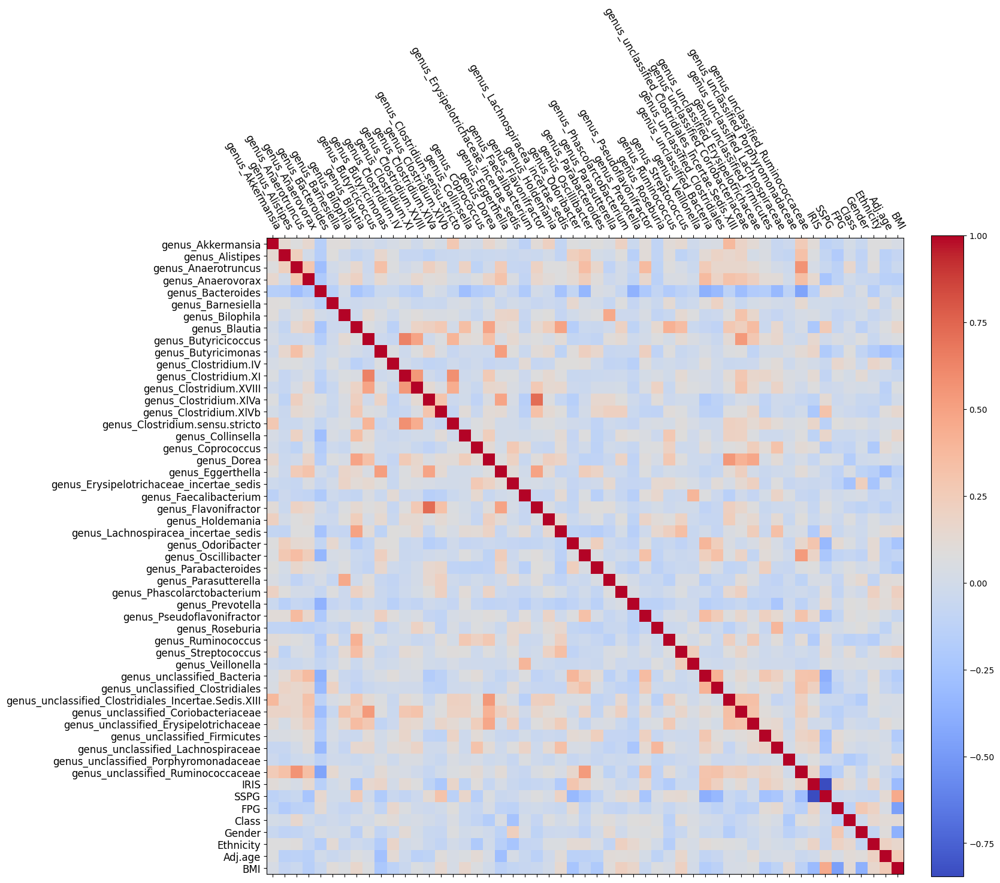

In [95]:
make_corr_plot(X)

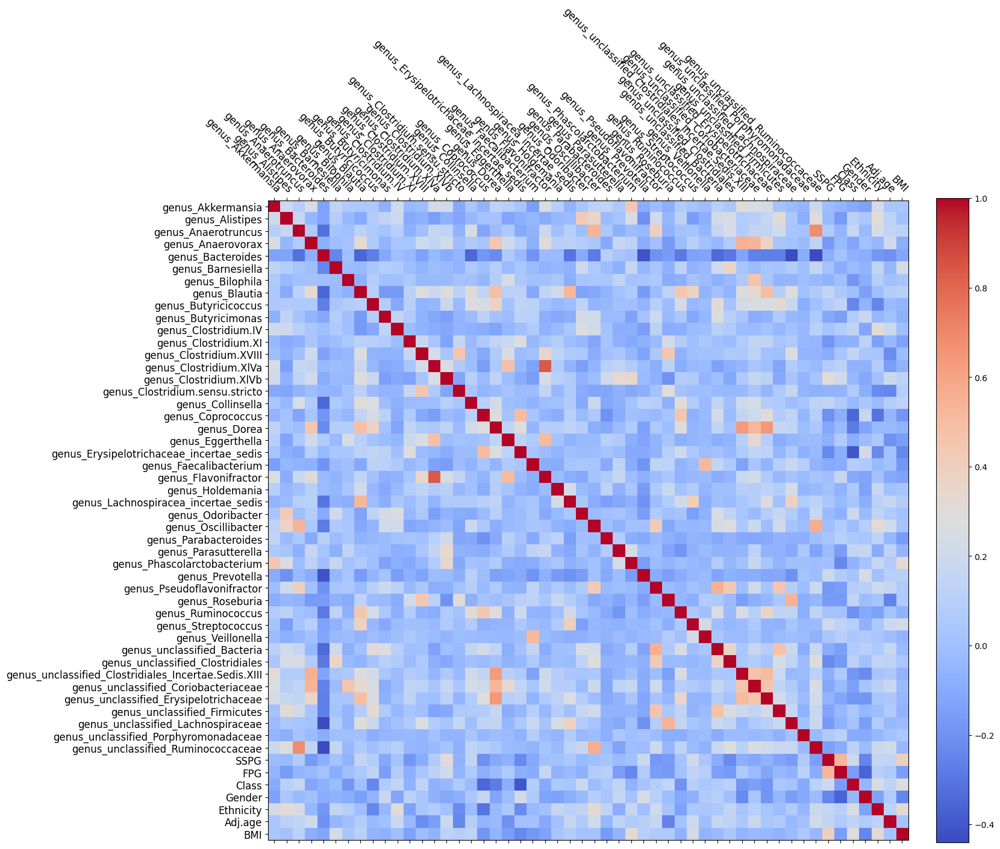

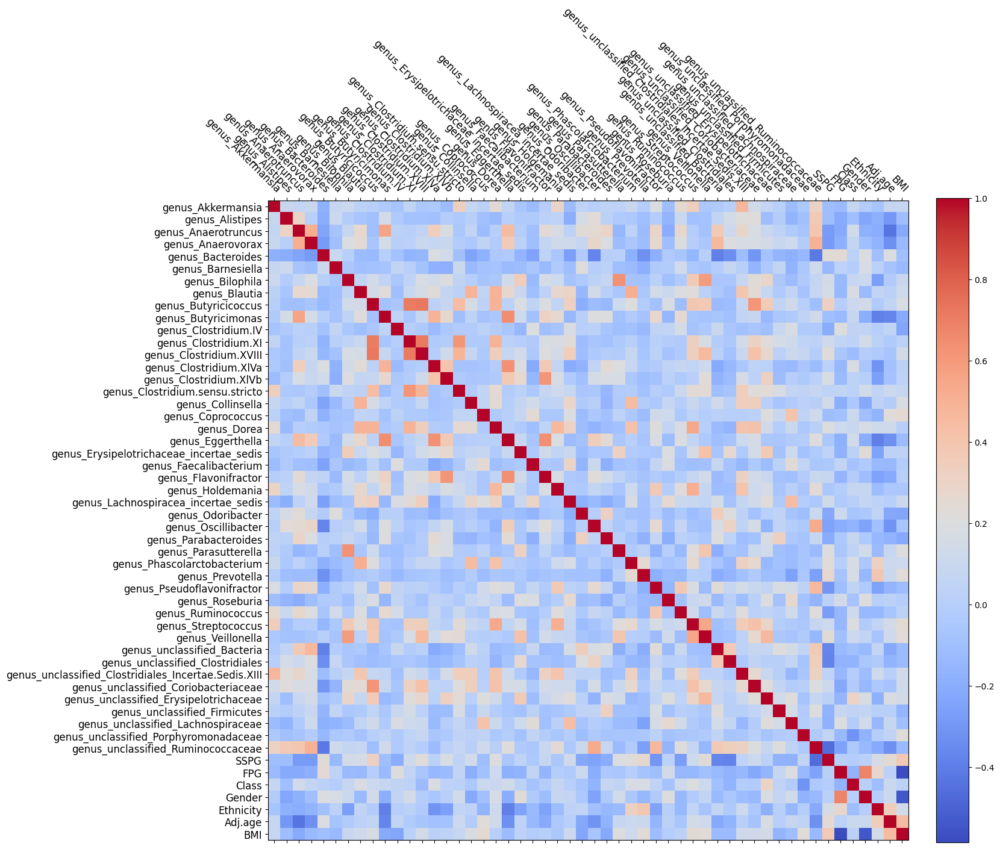

In [93]:
# correlations on IR vs IS
X_IR = X[X['IRIS'] == 0].drop(columns=['IRIS'])
X_IS = X[X['IRIS'] == 1].drop(columns=['IRIS'])
make_corr_plot(X_IR)
make_corr_plot(X_IS)

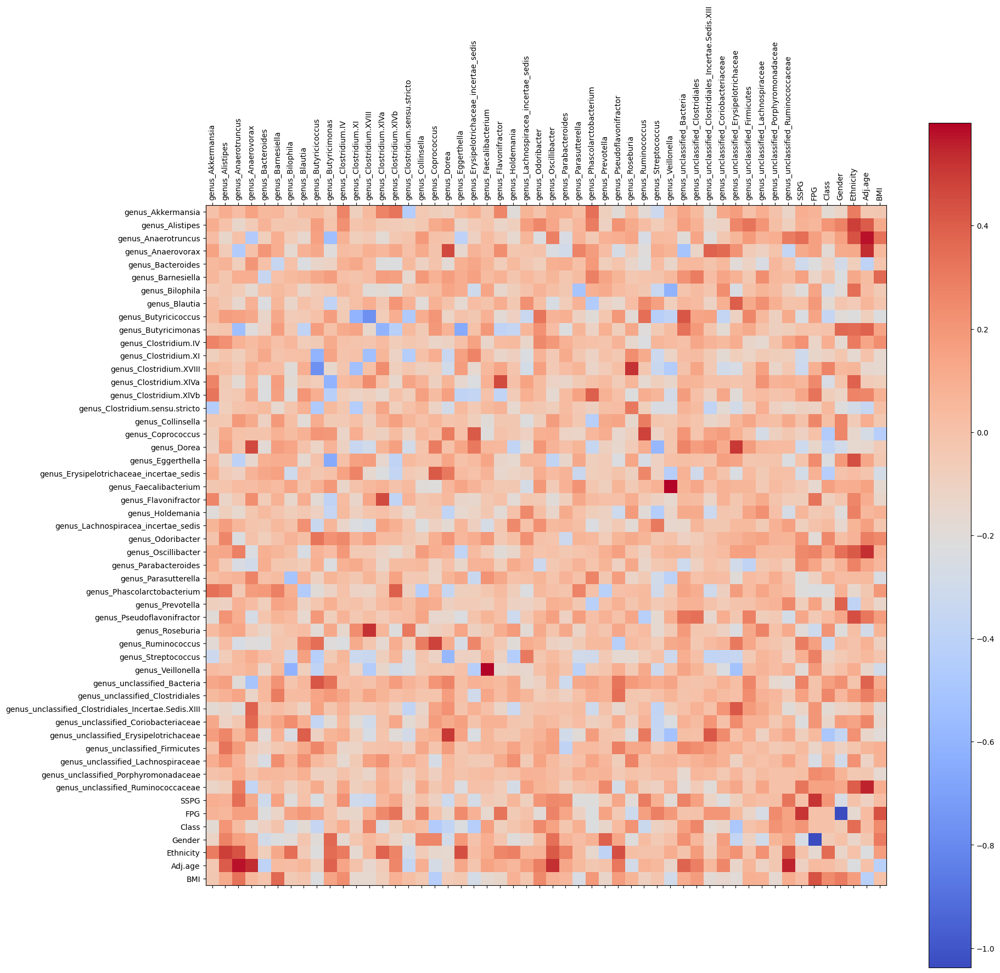

In [45]:
# Difference in correlations to spot any confounders or effect modifiers between the two groups

X_IR_corr = X_IR.corr()
X_IS_corr = X_IS.corr()
corr = X_IR_corr - X_IS_corr
full_columns = list(X_IR.columns)

fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot()
cax = ax.matshow(corr, cmap='coolwarm')
fig.colorbar(cax)

xaxis = np.arange(len(full_columns))
ax.set_xticks(xaxis)
ax.set_yticks(xaxis)
ax.set_xticklabels(full_columns, rotation=90)
ax.set_yticklabels(full_columns)

plt.show()

# Check Linearity Between Genera Abundancies

In [22]:
# THIS STEP MAY TAKE A WHILE (RUN AT YOUR OWN RISK)

fig, axs = plt.subplots(255, 5, figsize=(20, 700))
fig.suptitle('Distribution of Discrete Variables in Subject Info Data')

pairs_X = list(itertools.combinations(X.columns, 2))

axs = axs.ravel()

for i in range(len(pairs_X)):
    x = pairs_X[i][0]
    y = pairs_X[i][1]
    axs[i].scatter(x = X[x], y = X[y])
    axs[i].set_xlabel(x)
    axs[i].set_ylabel(y)
    
fig.subplots_adjust(top=0.975, wspace=0.2, hspace=0.15)

In [48]:
genera = X.drop(columns = ["IRIS", "SSPG", "FPG", "Class", "Gender", "Ethnicity", "Adj.age", "BMI"])

In [54]:
genera.iloc[:, 0]

0      0.004521
1      0.000092
2      0.000000
3      0.002365
4      0.002988
         ...   
326    0.000128
327    0.044381
328    0.000951
329    0.013300
330    0.000881
Name: genus_Akkermansia, Length: 331, dtype: float64

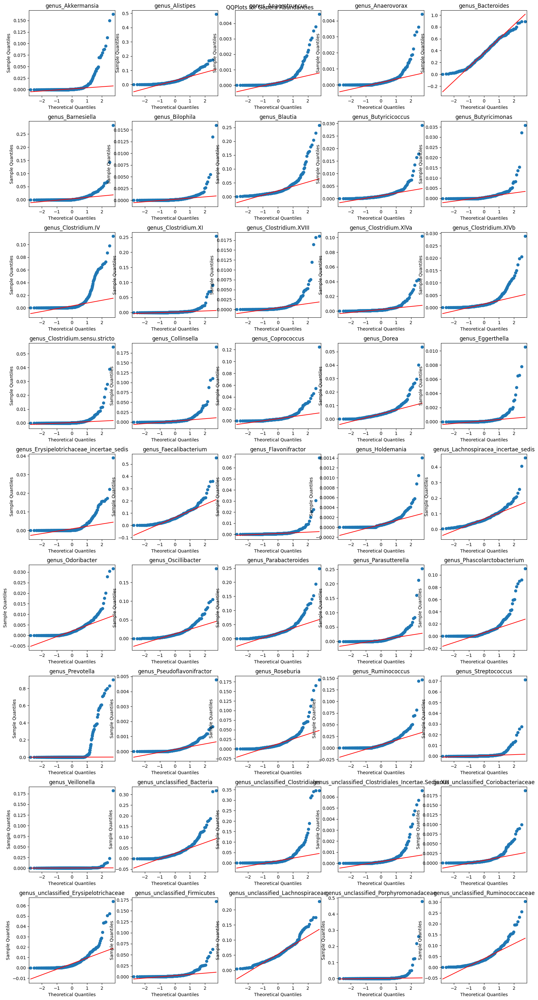

In [66]:
# fig, axs = plt.subplots(255, 5, figsize=(20, 700))
fig, axs = plt.subplots(9, 5, figsize=(20, 35))
fig.suptitle('QQPlots for Genera Abundancies')

axs = axs.ravel()

for i in range(len(genera.columns)):
    sm.qqplot(genera.iloc[:, i], line='q', ax=axs[i])
    axs[i].set_title(genera.columns[i])
    
fig.subplots_adjust(top=0.975, wspace=0.2, hspace=0.3)

In [ ]:
# check Gaussian

fig, axs = plt.subplots(2, 4, figsize=(20, 15))
fig.suptitle('Distribution of Continuous Variables in Subject Data for IR (Top) and IS (Bottom)')
continuous_var = ['SSPG', 'FPG', 'Adj.age', 'BMI'] 

subject_data_IR = subject_data[subject_data['IRIS'] == 'IR']
subject_data_IS = subject_data[subject_data['IRIS'] == 'IS']

axs = axs.ravel()

for i in range(4):
    col = continuous_var[i]
    sm.qqplot(subject_data_IR[col], line='q', ax=axs[i])
    axs[i].set_title(col)

for i in range(4, 8):
    col = continuous_var[i-4]
    sm.qqplot(subject_data_IS[col], line='q', ax=axs[i], markerfacecolor='#F97306', markeredgecolor='#F97306')
    axs[i].set_title(col)
    
plt.show()